In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 

In [3]:
df= pd.read_csv('data_cleaned2.csv')

In [4]:
df.describe()

,Unnamed: 0.1,Unnamed: 0,Total Solicitado €,Proyecto significativo,Total COSTES no IT solicitado,Total Capex Solicitado,Total Opex Solicitado,Horas,Cost
count,1358.000000,1358.000000,1.358000e+03,0.0,6.610000e+02,1.347000e+03,1347.000000,1358.000000,10.000000
mean,1074.589102,3477.431517,5.406927e+04,NaN,7.394518e+03,3.720408e+04,2703.368330,1615.384587,63183.065000
std,626.759054,2039.384595,2.844512e+05,NaN,1.620423e+05,1.145684e+05,17235.713657,3073.677389,35112.213454
min,1.000000,3.000000,3.500000e-01,NaN,0.000000e+00,0.000000e+00,0.000000,10.000000,14130.000000
25%,528.250000,1603.750000,3.877500e+01,NaN,0.000000e+00,2.098000e+01,0.000000,306.000000,28010.587500
50%,1078.500000,3685.000000,5.238800e+02,NaN,0.000000e+00,1.929800e+02,0.000000,739.500000,79335.000000
75%,1603.750000,5218.500000,3.421573e+04,NaN,0.000000e+00,3.064147e+04,0.000000,1659.500000,93250.000000
max,2526.000000,7951.000000,6.503438e+06,NaN,4.148667e+06,1.564959e+06,253090.400000,47112.000000,97988.300000


In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1712 entries, 0 to 1711
Data columns (total 53 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Unnamed: 0                                      1712 non-null   int64  
 1   Tipo de Entidad                                 1712 non-null   object 
 2   Agrupación IT Demanda                           1712 non-null   object 
 3   Plan                                            1712 non-null   object 
 4   Dominio                                         1712 non-null   object 
 5   Programa                                        1712 non-null   object 
 6   Clave                                           1712 non-null   object 
 7   Resumen                                         1712 non-null   object 
 8   Gestor Demanda                                  1712 non-null   object 
 9   Unidad IT                                

In [5]:
df.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'Tipo de Entidad',
       'Agrupación IT Demanda', 'Plan', 'Dominio', 'Programa', 'Clave',
       'Resumen', 'Gestor Demanda', 'Unidad IT', 'Categoría', 'IT Manager',
       'Fast Track', 'Prioridad', 'Total Solicitado €', 'Fecha inicio',
       'Fecha fin', 'Proyecto significativo', 'Business Owner',
       'Total COSTES no IT solicitado', 'Total Capex Solicitado',
       'Total Opex Solicitado', 'Agrupación IT de Ejecución', 'Objetivo',
       'Resumen proyecto', 'Justificación y Cálculo de los Beneficios',
       'Justificación y Cálculo de los Costes', 'Finanzas', 'Alcance',
       'Plazos', 'Milestones', 'KPIs', 'Unnamed: 31', 'Unnamed: 32',
       'Unnamed: 33', 'Unnamed: 34', 'Unnamed: 35', 'Benefits',
       'Coste Solicitado', 'Costes no IT solicitado',
       'Costes recurrentes solicitado', 'Informacional', 'Área Peticionaria',
       'Áreas involucradas', 'Agrupado PEP', 'Preselección para TCA',
       'Otros costes', 'Mejoras Beneficios

## 1.1 Agrupación IT de Ejecución for all

In [6]:
len(df["Agrupación IT de Ejecución"].unique())

31

In [7]:
# create a group using groupby
group = df.groupby(["Agrupación IT de Ejecución"])
  
# size of group to count observations
group = group.size()
  
# make a column name 
group.reset_index(name='Number of observations')

,Agrupación IT de Ejecución,Number of observations
0,ANALÍTICA E INTELIGENCIA ARTIFICIAL,3
1,BANCA TRANSACCIONAL,22
2,CIO CORE BANCARIO,1
3,CIO CORPORATE & INVESTMENT BANKING,2
4,CIO PROYECTOS CORPORATE & INVESTMENT BANKING,3
5,CIO PROYECTOS DATOS Y SISTEMAS CORPORATIVOS,4
6,"CONTRATACIÓN, FINANZAS Y CONTROL DE LA EJECUCIÓN",2
7,DIRECCIÓN DE SISTEMAS CORPORATIVOS,2
8,DIRECCIÓN DE TECNOLOGÍA,18
9,DIRECCIÓN ORGANIZACIÓN GLOBAL Y PROYECTOS CORPOR,1


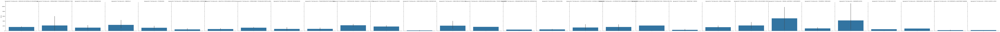

In [8]:
sns.catplot(y='Horas', data=df, col="Agrupación IT de Ejecución", kind="bar")
plt.xticks(rotation=90)
plt.show()

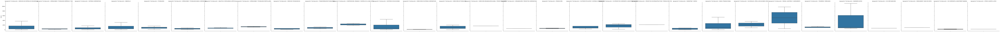

In [9]:
sns.catplot(y='Horas', data=df, kind="box", col="Agrupación IT de Ejecución", sym="")
plt.xticks(rotation=90)
plt.show()


Observations made after looking at the Data: 
-Average hours of each project: "Riesco, auditoria y complimiento" and "Ingeneria Datos" both have high averages, but with super high confidence intervalls too -> plausible explanations = 2 obs for "Riesco, auditoria y complimiento", 3 for "Ingeneria Datos" so small sample size
-Obervation of boxplots : Highest boxplots (medians) = ""Riesco, auditoria y complimiento"" and "Ingeniera Datos", but only 4 obs each!


## 1.2: Agrupación IT de Ejecución encoded

In [10]:
Agrupación_IT_de_Ejecución_encoded=[]
for x in df['Agrupación IT de Ejecución']:
    if x=="SERVICIOS DE ENTREGA DE DESARROLLO":
        Agrupación_IT_de_Ejecución_encoded.append(x)
    elif x=="GESTIÓN DE APLICACIONES":
        Agrupación_IT_de_Ejecución_encoded.append(x)
    else:
        Agrupación_IT_de_Ejecución_encoded.append("OTHER")

df["Agrupación_IT_de_Ejecución_encoded"]=Agrupación_IT_de_Ejecución_encoded


In [11]:
# create a group using groupby
group = df.groupby(["Agrupación_IT_de_Ejecución_encoded"])
  
# size of group to count observations
group = group.size()
  
# make a column name 
group.reset_index(name='Number of observations')

,Agrupación_IT_de_Ejecución_encoded,Number of observations
0,GESTIÓN DE APLICACIONES,214
1,OTHER,251
2,SERVICIOS DE ENTREGA DE DESARROLLO,893


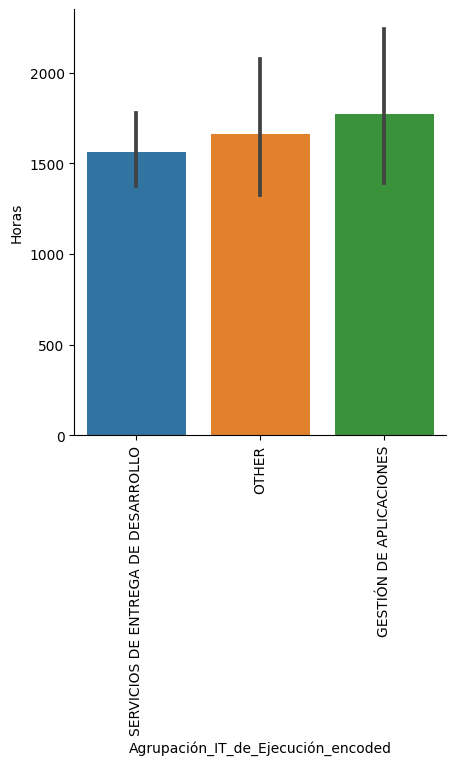

In [12]:
sns.catplot(x='Agrupación_IT_de_Ejecución_encoded', y='Horas', data=df, kind="bar")
plt.xticks(rotation=90)
plt.show()

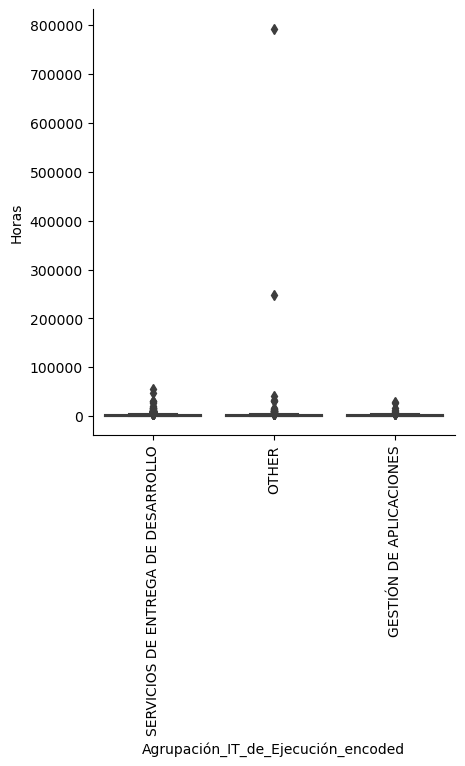

In [71]:
sns.catplot(x="Agrupación_IT_de_Ejecución_encoded", y='Horas', data=df, kind="box")
plt.xticks(rotation=90)
plt.show()

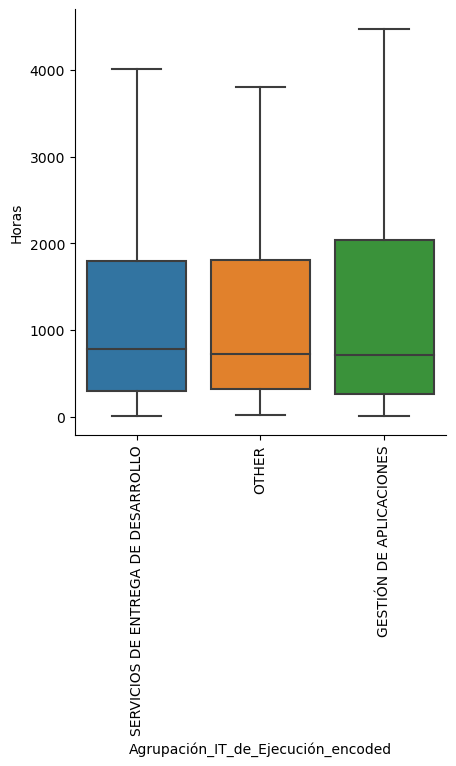

In [74]:
sns.catplot(x="Agrupación_IT_de_Ejecución_encoded", y='Horas', data=df, kind="box", sym="")
plt.xticks(rotation=90)
plt.show()

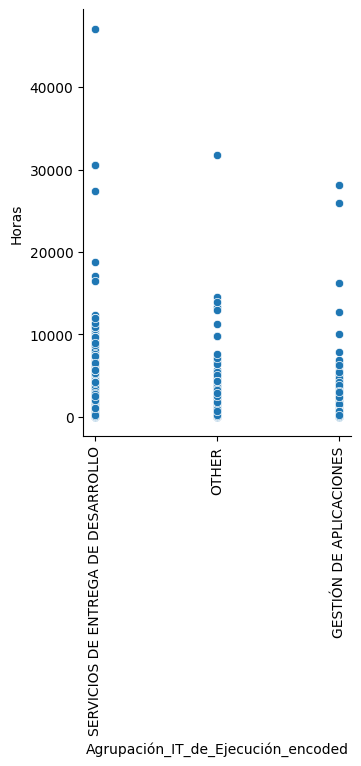

In [13]:
sns.relplot(x="Agrupación_IT_de_Ejecución_encoded", y='Horas', data=df, kind="scatter")
plt.xticks(rotation=90)
plt.show()

observations: same thing, due to the categories with high outliers

## 2: Objetivo

In [14]:
df['Objetivo'].unique()

array(['Run', 'Transform the Business', 'Normative', 'Resilience', 'Grow',
       'IT Modernisation', 'IT Efficiency', 'Cybersecurity & Protection',
       'Business Efficiency', 'Avoid obsolescence'], dtype=object)

In [15]:
# create a group using groupby
group = df.groupby(["Objetivo"])
  
# size of group to count observations
group = group.size()
  
# make a column name 
group.reset_index(name='Number of observations')

,Objetivo,Number of observations
0,Avoid obsolescence,15
1,Business Efficiency,365
2,Cybersecurity & Protection,21
3,Grow,93
4,IT Efficiency,54
5,IT Modernisation,25
6,Normative,428
7,Resilience,10
8,Run,253
9,Transform the Business,94


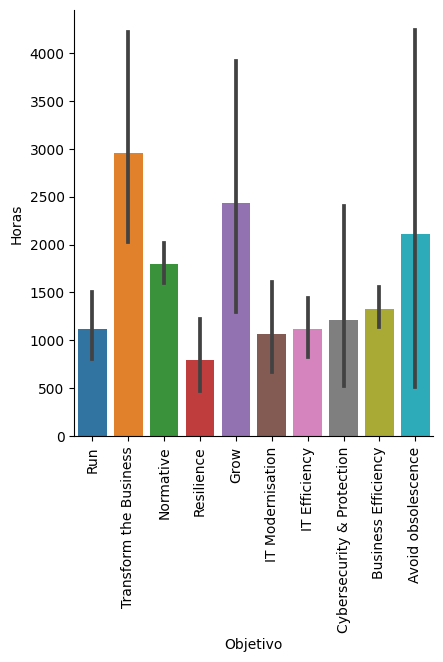

In [16]:
sns.catplot(x='Objetivo', y='Horas', data=df, kind="bar")
plt.xticks(rotation=90)
plt.show()

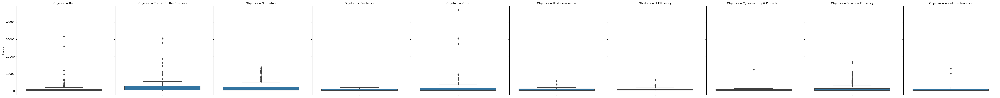

In [17]:
sns.catplot(y='Horas', data=df, col='Objetivo', kind="box")
plt.xticks(rotation=90)
plt.show()

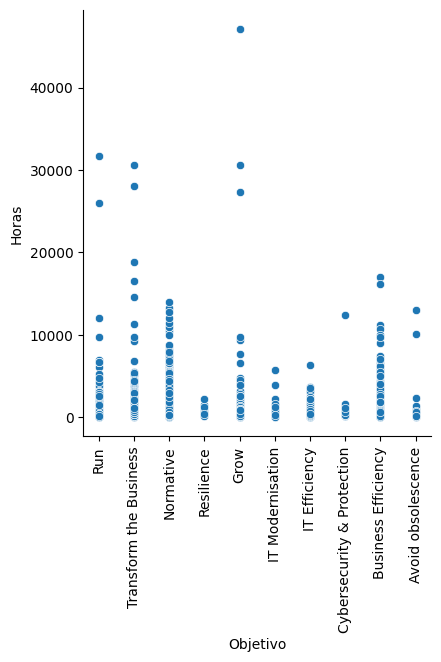

In [18]:
sns.relplot(x='Objetivo', y='Horas', data=df, kind="scatter")
plt.xticks(rotation=90)
plt.show()

Observations made after looking at the Data: 
-Average hours of each project: "Transformation" and "Grow" obsolescence have the highest, but as you can see the confidence interval of these means is large: high outliers in terms of project hours + less than 100 projects for each

## 3.Alcance

In [77]:
len(df['Alcance'].unique())

1673

This is text data: brief description of project
So we need to do text preprocessing and break down into topics

In [82]:
! pip install googletrans
! pip install --upgrade googletrans==4.0.0-rc1
! pip install -U gensim==3.8.3

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 1.4 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 1.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 3.1 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 747.4 kB/s eta 0:00:00a 0:00:01
  Created wheel for googletrans: filename=googletrans-3.0.0-py3-none-any.whl size=15721 sha256=8b850c61f83e85582e8021511a0eda2715cd10a2e5f19330ba0458af26a0cab8
  Stored in directory: /Users/nathanielthomascopeland/Library/Caches/pip/wheels/27/f3/32/d4859d40071f07a5df0ab6fdc0076e78a8a786625dde2b4b2f
Successfully built googletrans
  Attempting uninstall: chardet
    

In [83]:
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
from googletrans import Translator
from pprint import pprint

In [84]:
# trying translator library

translator = Translator()

translation = translator.translate("Hola Mundo")
print(translation.origin)
print(translation.text)

Hola Mundo
Hello World


In [86]:
alcance = df[['Alcance','Horas']]
alcance

,Alcance,Horas
0,"1. Desarrollar nuevos procesos y controles de calidad de la información en las BDD de MVA, destinados a regularizar la información incorrecta actual y prevenir incosistencias futuras \n2. Ejecutar el proceso de depuración sobre las BDD MVA",330.000000
1,Colaborar con la Asociación Española de Factoring (AEF) para la realización del diseño funcional y preparación de la documentación técnica necesaria para el posterior desarrollo y puesta en marcha de la plataforma,90.000000
2,"Como solución táctica de manera temporal, se recibirá un fichero con periodicidad mensual donde figure la relación de titularidad – marcas F8_PD, F8_NEGRO y F9, calculadas previamente en proceso SAS con los criterios ya definidos y que se tendrán que construir en robusto a posteriori en Data.",412.000000
3,Confección de un listado atípico,290.000000
4,Desarrollo de procesos ETL y de creación de BDD,168.000000
5,Realizar marcajes de las bajas en SIBIS y SIREC,483.000000
6,"generar un uso informacional para Riesgos con los registros de la CIRBE en situación I16 e I17, historificado",250.000000
7,"Se requiere automatizar el proceso de envío a los clientes con característica de Liquidity Provider, del fichero que BME genera.",357.000000
8,Reportar modelo FATCA/CRS oficinas OFEX EMEA,297.000000
9,Cambios solicitados por BSV hasta 31/12,34.000000


In [87]:
# Translating into english

for idx, text in alcance['Alcance'].items():
    try:
        alcance.loc[idx, 'Alcance'] = translator.translate(text).text
    except:
        pass   

alcance

,Alcance,Horas
0,"1. Develop new information quality processes and controls in MVA BDDs, aimed at regularizing current incorrect information and preventing future incosistencies\n2. Execute the purification process on MVA BDD",330.000000
1,Collaborate with the Spanish Factoring Association (AEF) for the realization of the functional design and preparation of the technical documentation necessary for the subsequent development and commissioning of the platform,90.000000
2,"As a tactical solution temporarily, a monthly periodicity will be received where the ownership ratio - F8_PD, F8_Negro and F9.",412.000000
3,Preparation of an atypical list,290.000000
4,ETL and BDD creation processes development,168.000000
5,Make marks of the casualties in Sibis and Sirec,483.000000
6,"generate an informational use for risks with the CIRBE records in situation i16 and i17, historified",250.000000
7,"It is required to automate the process of shipping to customers with a characteristic of Liquidity Provider, of the file that BME generates.",357.000000
8,Report Fatca/CRS Model Workshops Offering Emea,297.000000
9,Changes requested by BSV until 12/31,34.000000


In [89]:
alcance.to_csv("alcance_eng.csv")
alcance_eng = pd.read_csv("alcance_eng.csv")
alcance_eng = alcance_eng.drop(columns=['Unnamed: 0'])

In [90]:
import nltk
from nltk.stem import *
nltk.download("punkt") # For Stemming
nltk.download("wordnet") # For Lemmatization
nltk.download("stopwords") # For Stopword Removal
nltk.download("omw-1.4")


import re
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

from nltk.stem import PorterStemmer

import string


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/nathanielthomascopeland/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/nathanielthomascopeland/nltk_data...
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/nathanielthomascopeland/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/nathanielthomascopeland/nltk_data...


In [91]:
stopwords = set(nltk.corpus.stopwords.words('english'))

In [92]:
# With lemmatization

alcance_processed_lem = []
lem = WordNetLemmatizer()


# Use regular expressions to tokenize the text
pattern = r'\w+|[^\w\s]+'
regex_tokenizer = re.compile(pattern)

for idx, alcance in alcance_eng['Alcance'].items():
    #resumen = resumen.lower()
    words_tokenized = regex_tokenizer.findall(alcance)
    words_no_punc = [w for w in words_tokenized if not regex_tokenizer.match(w).group(0).isspace()]
    no_stop_words = [w for w in words_no_punc if w.lower() not in stopwords]
    words = [lem.lemmatize(w) for w in no_stop_words if len(w) > 2]

    alcance_processed_lem.append(words)

In [93]:
alcance_eng['Alcance_preprocessed_lem'] = alcance_processed_lem

TOPIC Modellinh

In [94]:
import gensim

In [95]:


dic = gensim.corpora.Dictionary(alcance_processed_lem) 

bow_corpus = [dic.doc2bow(alcance) for alcance in alcance_processed_lem]

import pickle # Useful for storing big datasets
pickle.dump(bow_corpus, open('corpus.pkl', 'wb'))
dic.save('dictionary.gensim')

In [96]:
lda_model = gensim.models.LdaMulticore(bow_corpus,
                                   num_topics = 5,
                                    id2word = dic,
                                      passes = 10,
                                      workers = 2)
lda_model.save('model4.gensim')

In [97]:
for idx, topic in lda_model.print_topics(num_words=10):    
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 0 
Words: 0.021*"new" + 0.017*"information" + 0.015*"application" + 0.009*"risk" + 0.008*"process" + 0.008*"file" + 0.005*"operation" + 0.005*"contract" + 0.005*"system" + 0.004*"screen"
Topic: 1 
Words: 0.009*"new" + 0.007*"information" + 0.007*"system" + 0.006*"generation" + 0.006*"current" + 0.006*"process" + 0.005*"modification" + 0.005*"service" + 0.005*"customer" + 0.005*"application"
Topic: 2 
Words: 0.009*"application" + 0.009*"operation" + 0.006*"office" + 0.006*"process" + 0.005*"manager" + 0.005*"file" + 0.005*"product" + 0.005*"loan" + 0.004*"information" + 0.004*"risk"
Topic: 3 
Words: 0.010*"process" + 0.008*"application" + 0.007*"new" + 0.007*"project" + 0.006*"management" + 0.006*"model" + 0.005*"customer" + 0.005*"information" + 0.005*"data" + 0.005*"necessary"
Topic: 4 
Words: 0.012*"process" + 0.011*"new" + 0.011*"information" + 0.008*"application" + 0.008*"data" + 0.007*"development" + 0.007*"operation" + 0.007*"card" + 0.006*"client" + 0.006*"customer"


##  4.1 IT Manager for all

- To extract some insights, I had to use the same x-axis scale for all plots
- This allowed to see if some managers visually have longer projects than other 
- However, as most managers have a low number of hours the majority of boxplots appear on the far left and small
- From the scatterplot, it was possible to see that most managers have projects of less than 5000 hours and that there are some managers with 'outlier' values

In [20]:
df = pd.read_csv('data_cleaned.csv')
df1 = df[['Unidad IT','IT Manager','Horas']]

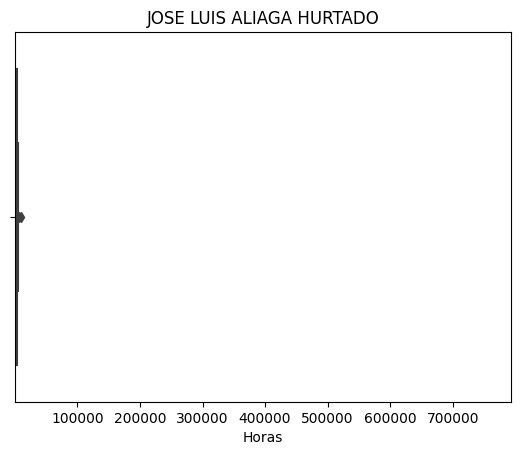

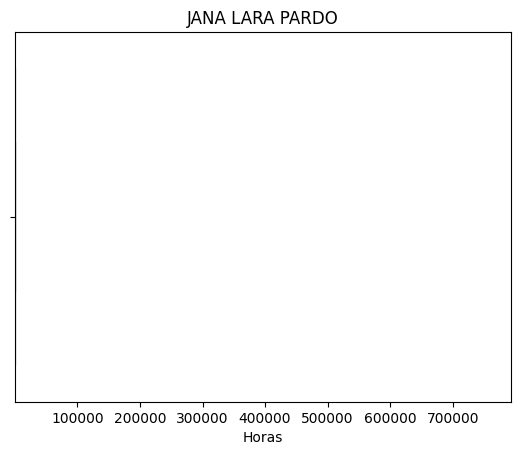

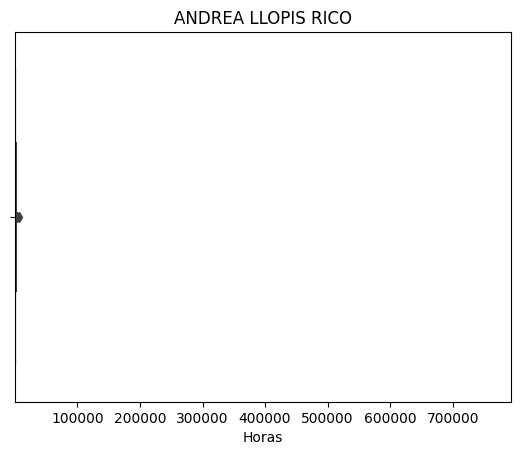

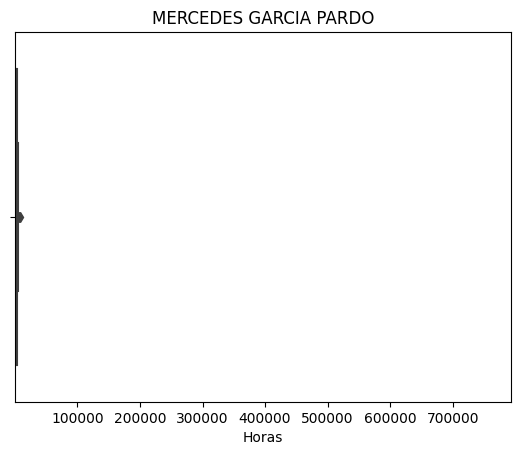

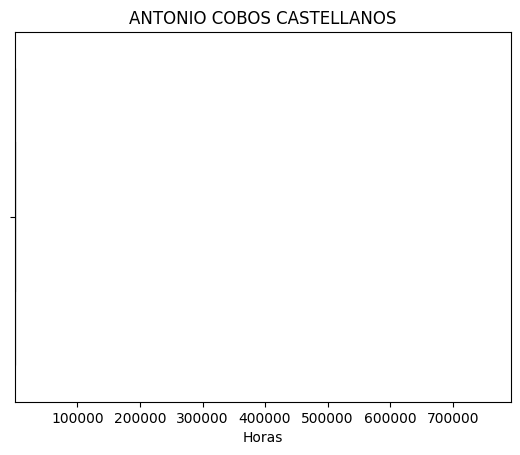

...

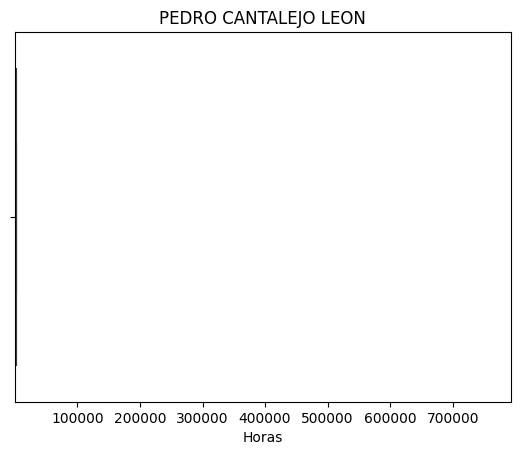

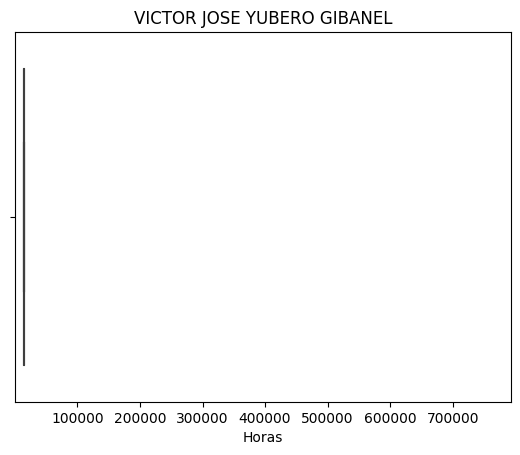

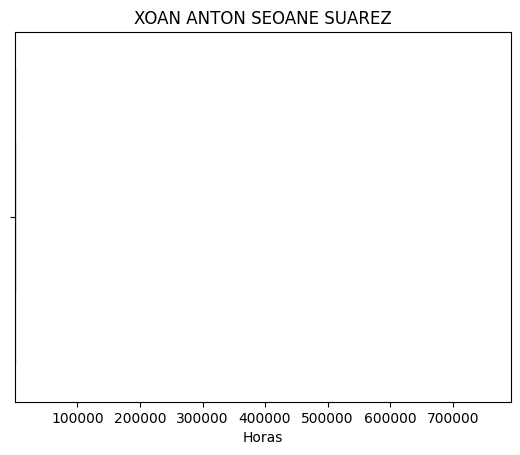

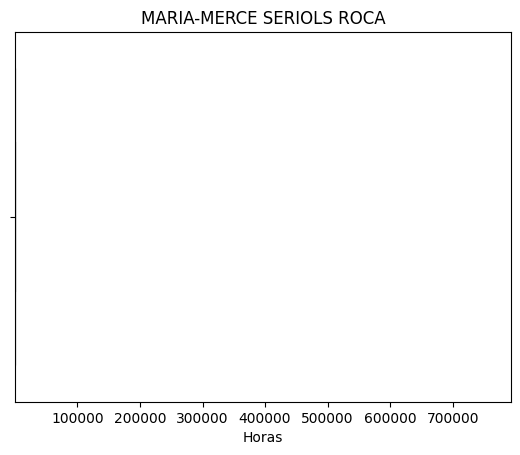

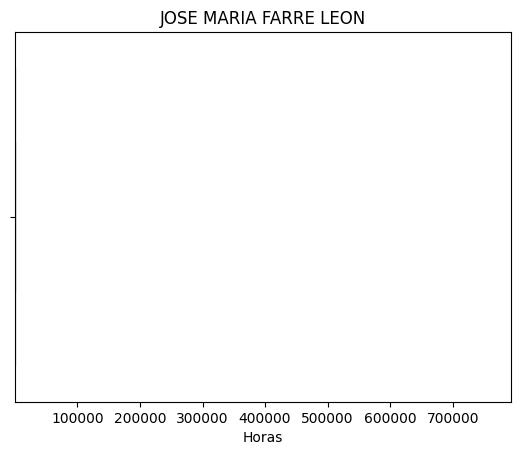

In [21]:
x_min = df1['Horas'].min()
x_max = df1['Horas'].max()


for manager in df1['IT Manager'].unique():
    sns.boxplot(x='Horas', data=df1[df1['IT Manager']==manager])
    plt.title(manager)
    plt.xlim(x_min, x_max)
    plt.show()


In [22]:
x = df1[df1['IT Manager']=='JOSE LUIS ALIAGA HURTADO']['Horas'].tolist()
max(x)

9758.0

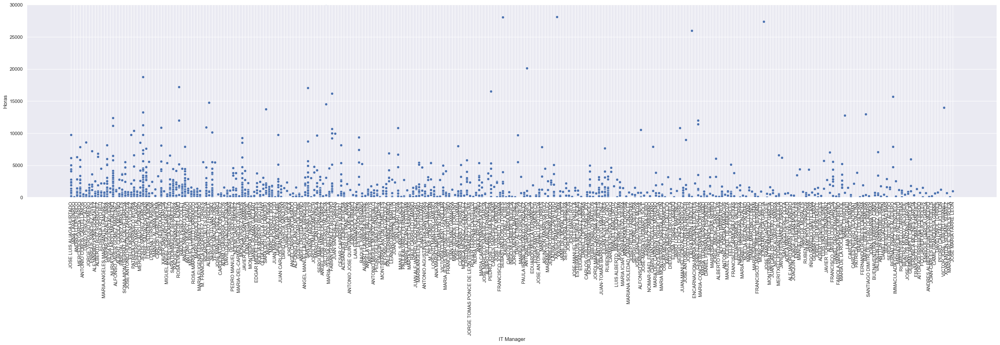

In [23]:
sns.set(rc={'figure.figsize':(40,8)}) 

sns.scatterplot(x='IT Manager', y='Horas', data=df)
plt.xticks(rotation=90)
plt.ylim(0,30000)
plt.show()

## 4.2. IT Manager with 'other'

In [24]:
tabla_manager = df1["IT Manager"].value_counts()
top_manager = tabla_manager[0:13]
top_manager = top_manager.index.tolist()

In [27]:
df1['Top IT Managers']=df1['IT Manager']
df1.loc[~df1['Top IT Managers'].isin(top_manager), 'Top IT Managers'] = 'Other'
df1

/var/folders/p5/9npcw21d3xs054yxn9xh232h0000gn/T/ipykernel_20028/1122746919.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Top IT Managers']=df1['IT Manager']


,Unidad IT,IT Manager,Horas,Top IT Managers
0,5881 - C&R y Gestión de Activos Irregulares,JOSE LUIS ALIAGA HURTADO,330.00,JOSE LUIS ALIAGA HURTADO
1,8411 - Gestión de Proyectos,JANA LARA PARDO,90.00,Other
2,7997 - Data Solutions,ANDREA LLOPIS RICO,412.00,ANDREA LLOPIS RICO
3,7559 - Activo y Pasivo,MERCEDES GARCIA PARDO,290.00,Other
4,5881 - C&R y Gestión de Activos Irregulares,JOSE LUIS ALIAGA HURTADO,168.00,JOSE LUIS ALIAGA HURTADO
...,...,...,...,...
1707,6354 - Cards,MONICA PEREZ RAMOS,217.00,MONICA PEREZ RAMOS
1708,6370 - Aplicaciones de distibución de seguros,JOSE ANGEL LLEO DAMIA,7982.39,Other
1709,"6042 - Préstamos, créditos, garantías, avales",ANTONIO SARABIA CRESPO,20127.00,Other
1710,6066 - Financial Reporting & Control,JOSE MARIA FARRE LEON,980.00,Other


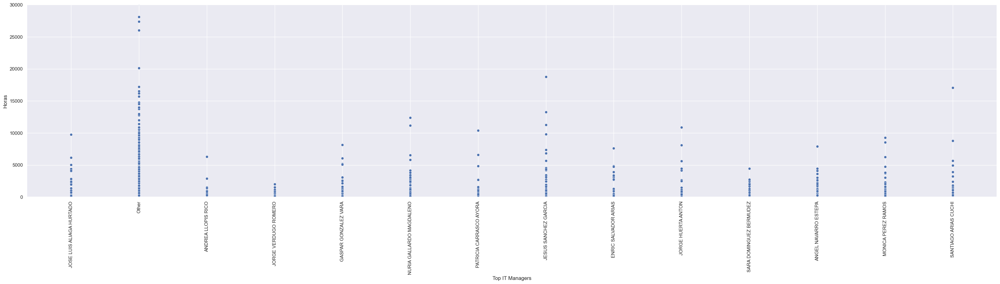

In [28]:
sns.set(rc={'figure.figsize':(40,8)}) 

sns.scatterplot(x='Top IT Managers', y='Horas', data=df1)
plt.xticks(rotation=90)
plt.ylim(0,30000)
plt.show()

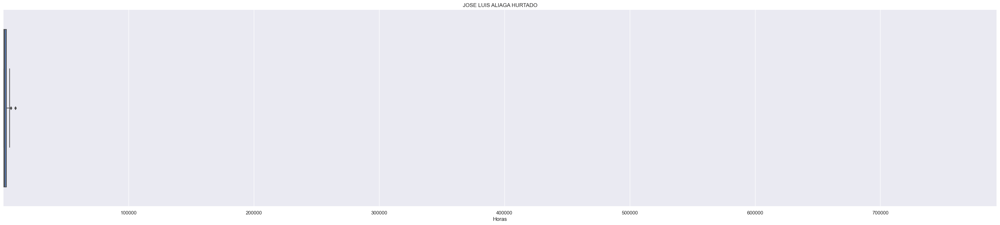

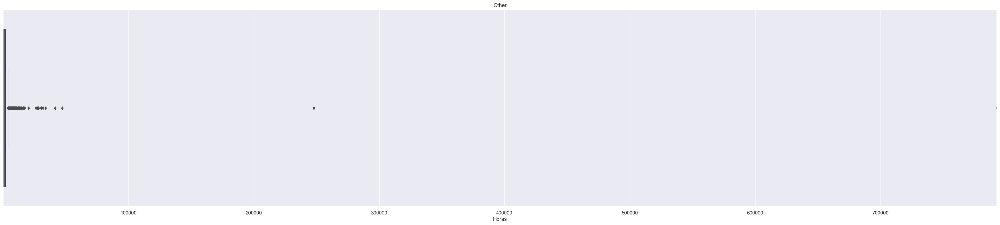

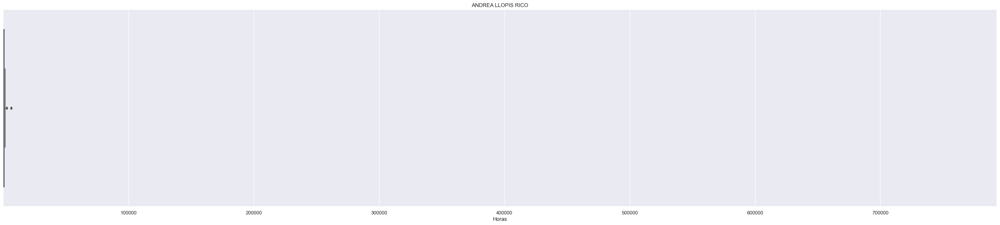

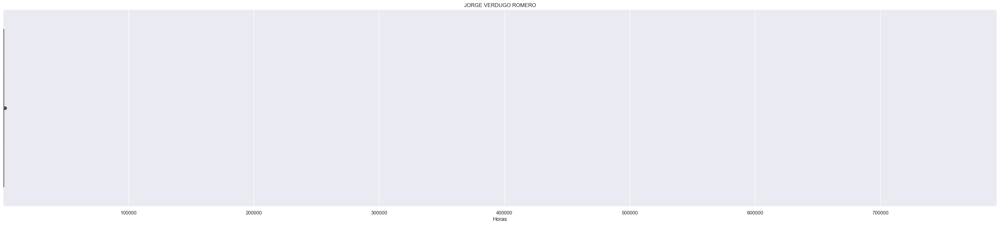

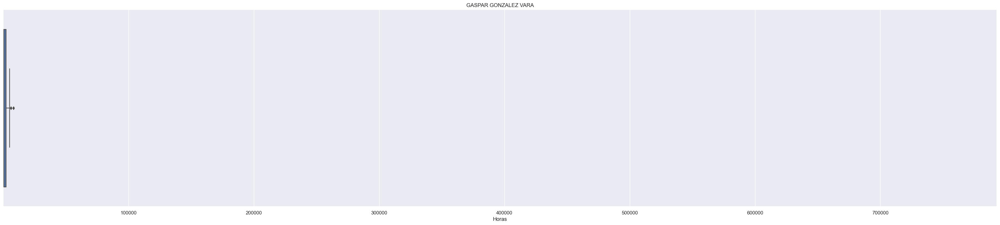

...

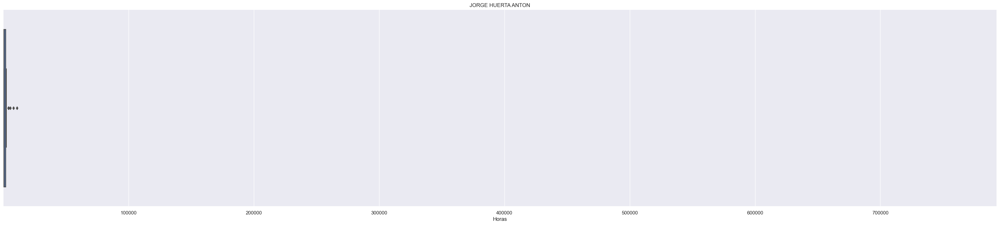

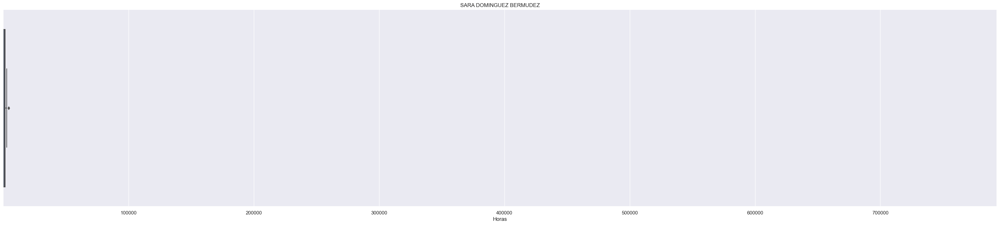

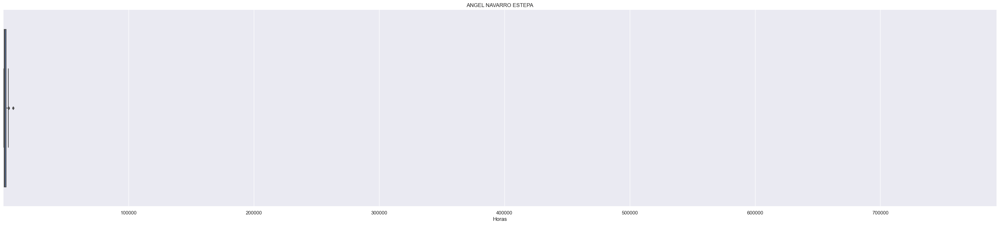

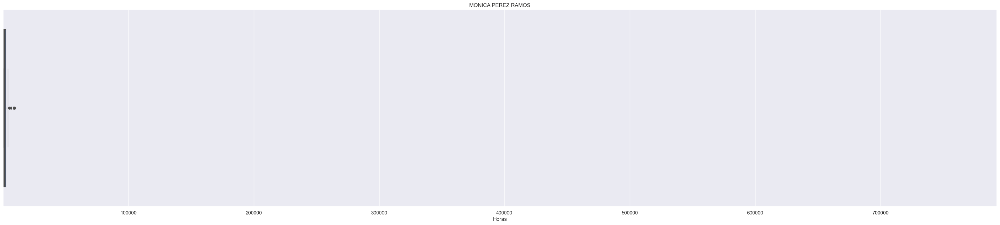

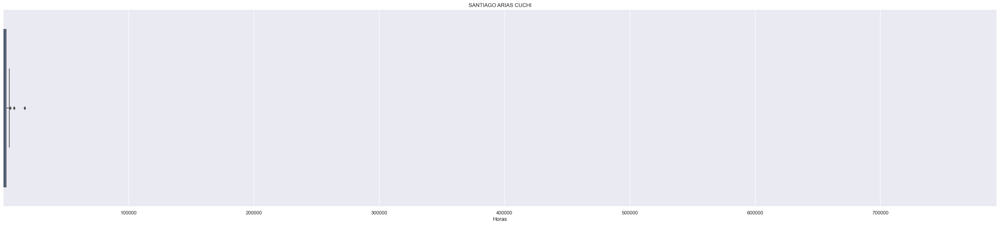

In [29]:
x_min = df1['Horas'].min()
x_max = df1['Horas'].max()


for manager in df1['Top IT Managers'].unique():
    sns.boxplot(x='Horas', data=df1[df1['Top IT Managers']==manager])
    plt.title(manager)
    plt.xlim(x_min, x_max)
    plt.show()

## 5.1. Unidad IT with all

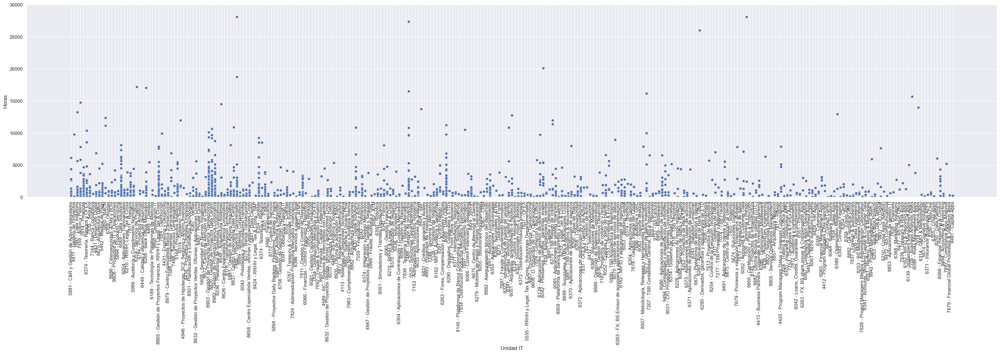

In [31]:
sns.set(rc={'figure.figsize':(40,8)}) 

sns.scatterplot(x='Unidad IT', y='Horas', data=df1)
plt.xticks(rotation=90)
plt.ylim(0,30000)
plt.show()

## 5.2. Unidad IT with other 

In [32]:
tabla_unidad = df1["Unidad IT"].value_counts()
top_unidad = tabla_unidad[0:42]
top_unidad = top_unidad.index.tolist()
top_unidad

['6069 - Data Solutions',
 '6069 - Data Output',
 '8903 - Gestión de Proyectos Banca Transaccional',
 '8820 - Gestión de Proyectos Data Centric',
 '5164 - Proyectos Analíticos',
 '8982 - Gestión de Proyectos Banca Corporativa',
 '8865 - Gestión de Proyectos Finanzas, RRHH y Legal, Tax & Cross',
 '6351 - Pagos',
 '7614 - Finanzas',
 '7811 - Gestión y Control de Riesgos',
 '6374 - Tesorería, Riesgos y OFEX',
 '6354 - Tarjetas',
 '4430 - Digital Solutions',
 '7488 - Gestión de proyectos',
 '7997 - Data Solutions',
 '6260 - Back Office Mercados',
 '8424 - RRHH',
 '5442 - Medios de Pago',
 '9608 - Proyectos de IT y Operaciones',
 '7811 - Riesgos',
 '6086 - Aplicaciones de gestión de riesgos',
 '7559 - Activo y Pasivo',
 '6162 - MIFID, Auditoría y Seguridad',
 '7833 - Seguros',
 '5989 - Auditoría y Cumplimiento Normativo',
 '6042 - Préstamos, créditos, garantías, avales',
 '8658 - Centro Especialista Ventas, oficinas y aplicaciones Cross',
 '7488 - Proyectos Transversales',
 '5881 - Gestión 

In [33]:
df1['Top Unidad IT']=df1['Unidad IT']
df1.loc[~df1['Top Unidad IT'].isin(top_unidad), 'Top Unidad IT'] = 'Other'
df1

/var/folders/p5/9npcw21d3xs054yxn9xh232h0000gn/T/ipykernel_20028/3762163573.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Top Unidad IT']=df1['Unidad IT']


,Unidad IT,IT Manager,Horas,Top IT Managers,Top Unidad IT
0,5881 - C&R y Gestión de Activos Irregulares,JOSE LUIS ALIAGA HURTADO,330.00,JOSE LUIS ALIAGA HURTADO,5881 - C&R y Gestión de Activos Irregulares
1,8411 - Gestión de Proyectos,JANA LARA PARDO,90.00,Other,Other
2,7997 - Data Solutions,ANDREA LLOPIS RICO,412.00,ANDREA LLOPIS RICO,7997 - Data Solutions
3,7559 - Activo y Pasivo,MERCEDES GARCIA PARDO,290.00,Other,7559 - Activo y Pasivo
4,5881 - C&R y Gestión de Activos Irregulares,JOSE LUIS ALIAGA HURTADO,168.00,JOSE LUIS ALIAGA HURTADO,5881 - C&R y Gestión de Activos Irregulares
...,...,...,...,...,...
1707,6354 - Cards,MONICA PEREZ RAMOS,217.00,MONICA PEREZ RAMOS,Other
1708,6370 - Aplicaciones de distibución de seguros,JOSE ANGEL LLEO DAMIA,7982.39,Other,Other
1709,"6042 - Préstamos, créditos, garantías, avales",ANTONIO SARABIA CRESPO,20127.00,Other,"6042 - Préstamos, créditos, garantías, avales"
1710,6066 - Financial Reporting & Control,JOSE MARIA FARRE LEON,980.00,Other,6066 - Financial Reporting & Control


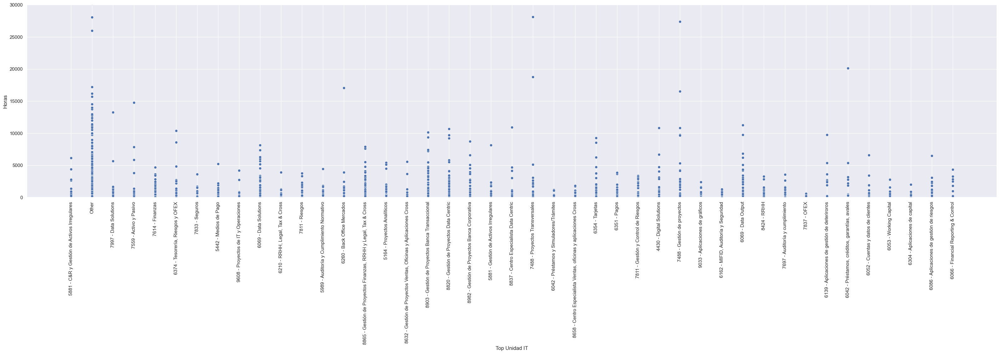

In [34]:
sns.set(rc={'figure.figsize':(40,8)}) 

sns.scatterplot(x='Top Unidad IT', y='Horas', data=df1)
plt.xticks(rotation=90)
plt.ylim(0,30000)
plt.show()

In [35]:
df = pd.read_csv("data_cleaned.csv")
index= df.loc[df['Horas'] > 300000].index
df= df.drop(index=index)

## 6. Prioridad

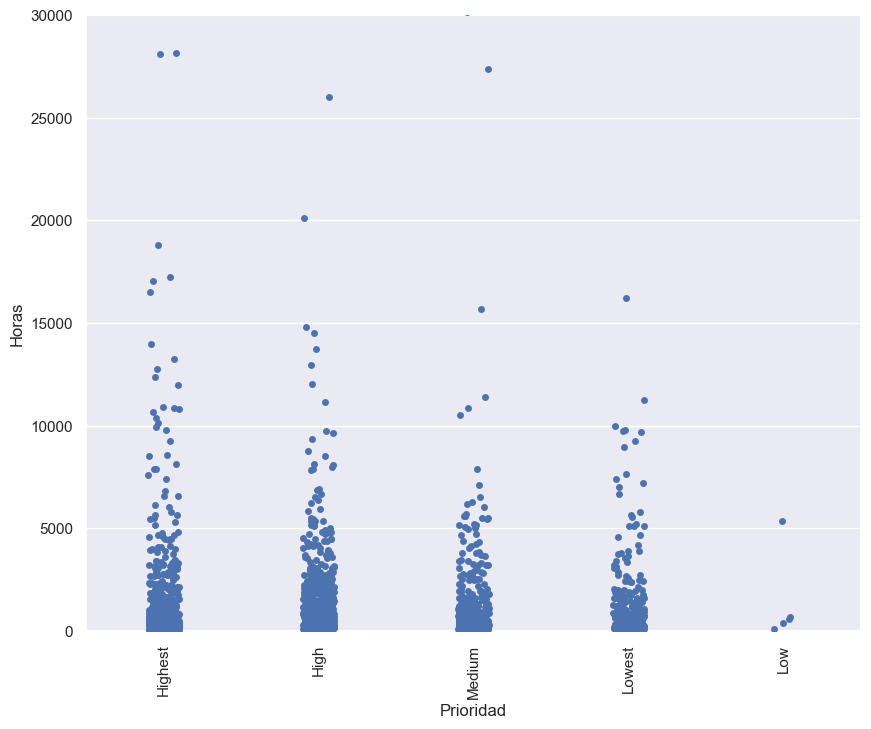

In [36]:
import seaborn as sns
sns.set(rc={'figure.figsize':(10,8)}) 
sns.stripplot(x="Prioridad", y="Horas", data=df) 
plt.xticks(rotation=90)
plt.ylim(0,30000)
plt.show()

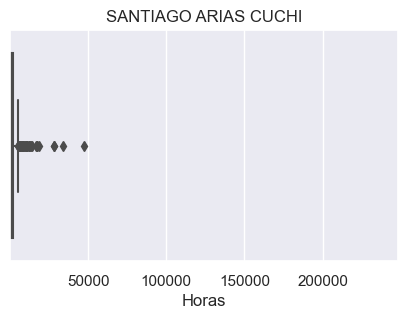

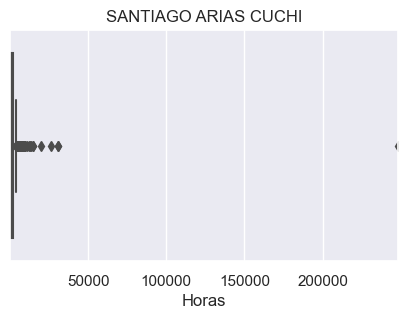

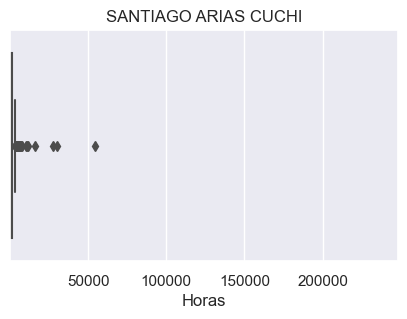

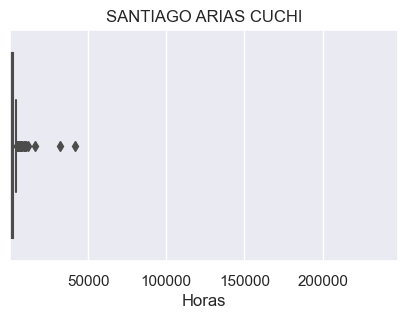

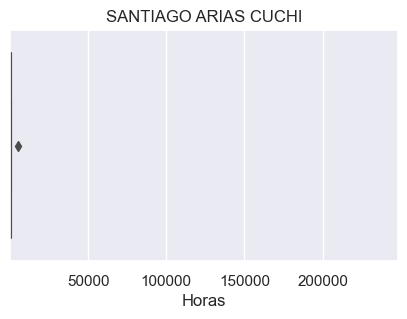

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt

x_min = df['Horas'].min()
x_max = df['Horas'].max()


for level in df['Prioridad'].unique():
    sns.set(rc={'figure.figsize':(5,3)}) 
    sns.boxplot(x='Horas', data=df[df['Prioridad']==level])
    plt.title(manager)
    plt.xlim(x_min, x_max)
    plt.show()

### 7. Business Owner

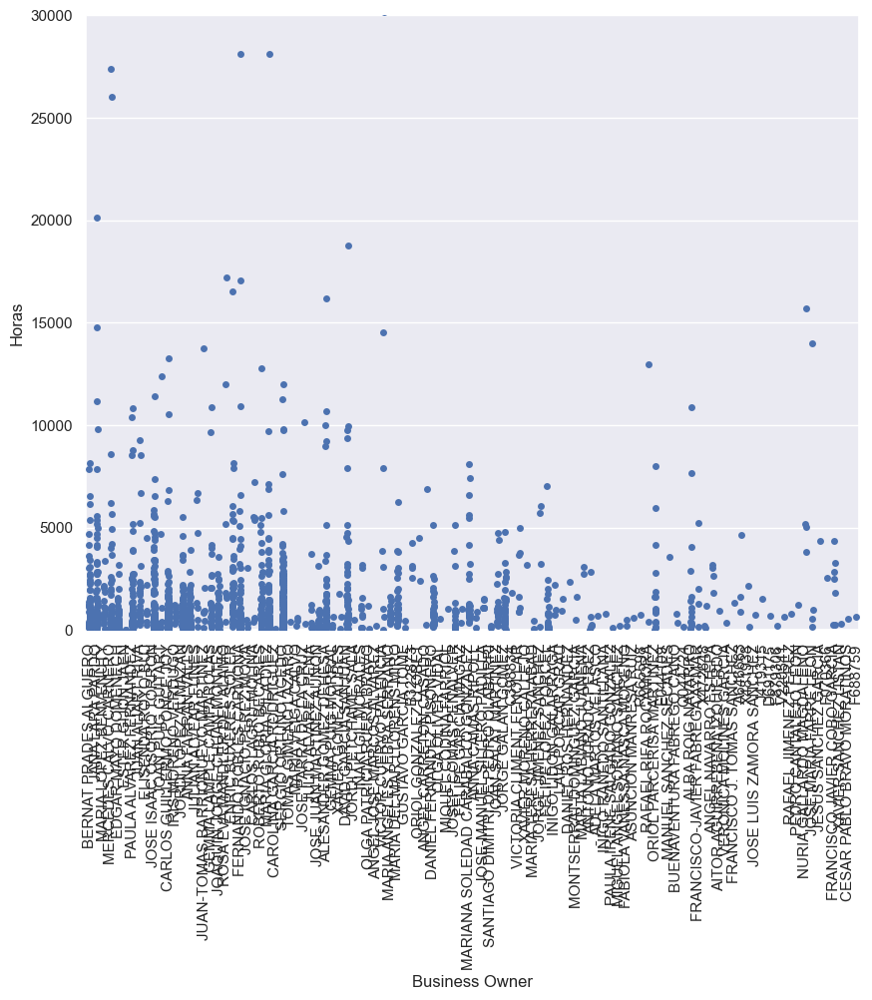

In [38]:
# Business Owner
sns.set(rc={'figure.figsize':(10,8)}) 
sns.stripplot(x="Business Owner", y="Horas", data=df) 
plt.xticks(rotation=90)
plt.ylim(0,30000)
plt.show()

In [39]:
frequency_ordered = df['Business Owner'].value_counts().sort_values(ascending=False)

# calculate the threshold for the top 10%
threshold = int(len(frequency_ordered) * 0.1)

# select the top 10% categories
top_categories = frequency_ordered[:threshold].index.tolist()

# Encode low-frequency categories
top_10 = df['Business Owner'].value_counts()
condition = -df['Business Owner'].isin(top_categories)

df.loc[condition, 'Business Owner'] = 'Others'

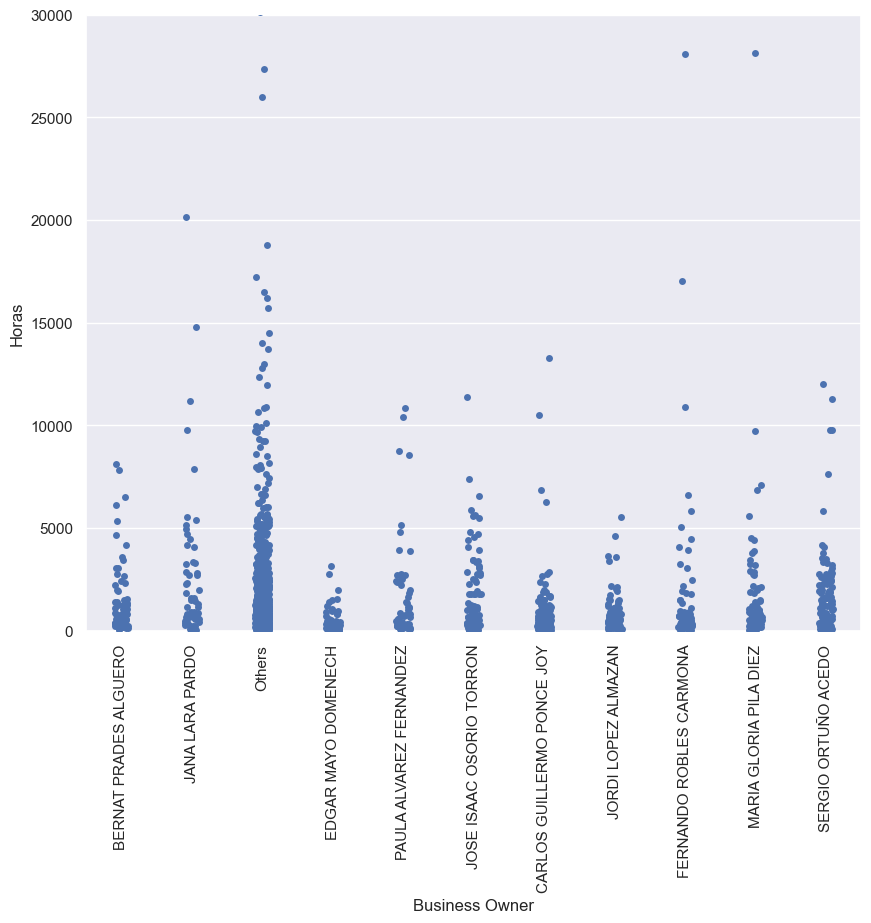

In [40]:
sns.set(rc={'figure.figsize':(10,8)}) 

sns.stripplot(x="Business Owner", y="Horas", data=df) 
plt.xticks(rotation=90)
plt.ylim(0,30000)
plt.show()


In [41]:
df = pd.read_csv('data_cleaned.csv')

## 8.Informacional

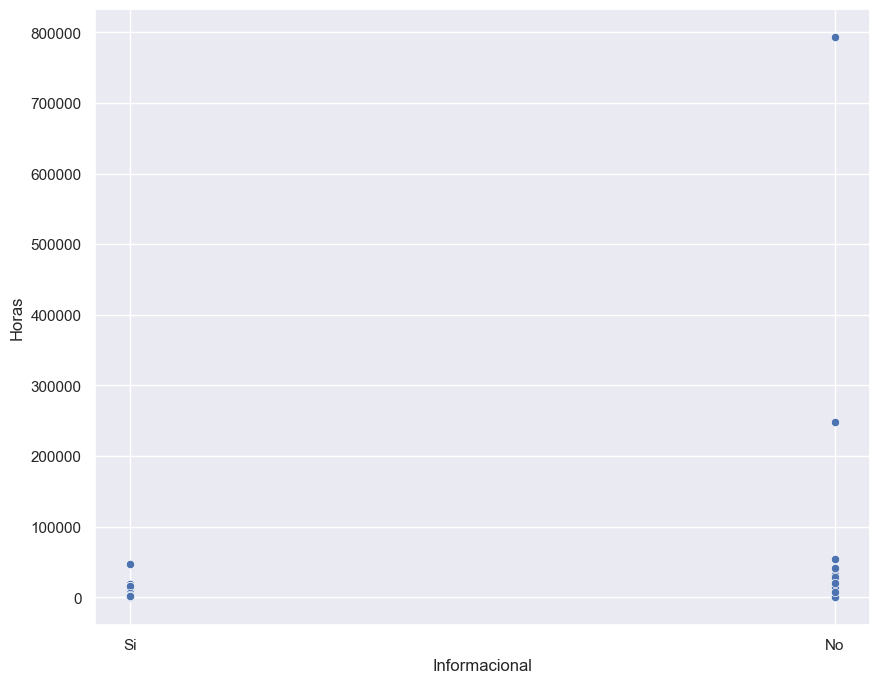

In [42]:
sns.scatterplot(x='Informacional', y='Horas', data=df)
plt.show()

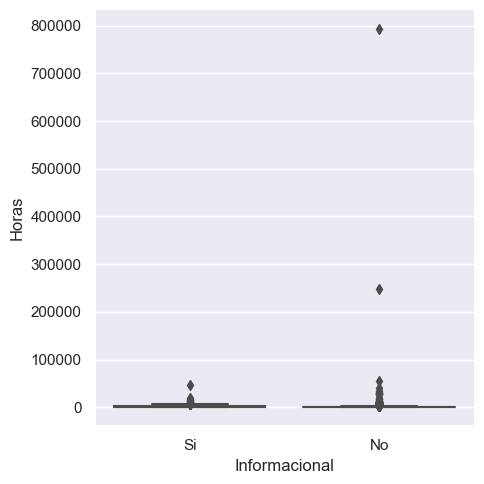

In [43]:
g = sns.catplot(x='Informacional', y='Horas', data=df, kind="box")
plt.show()

## 9. Áreas Involucradas

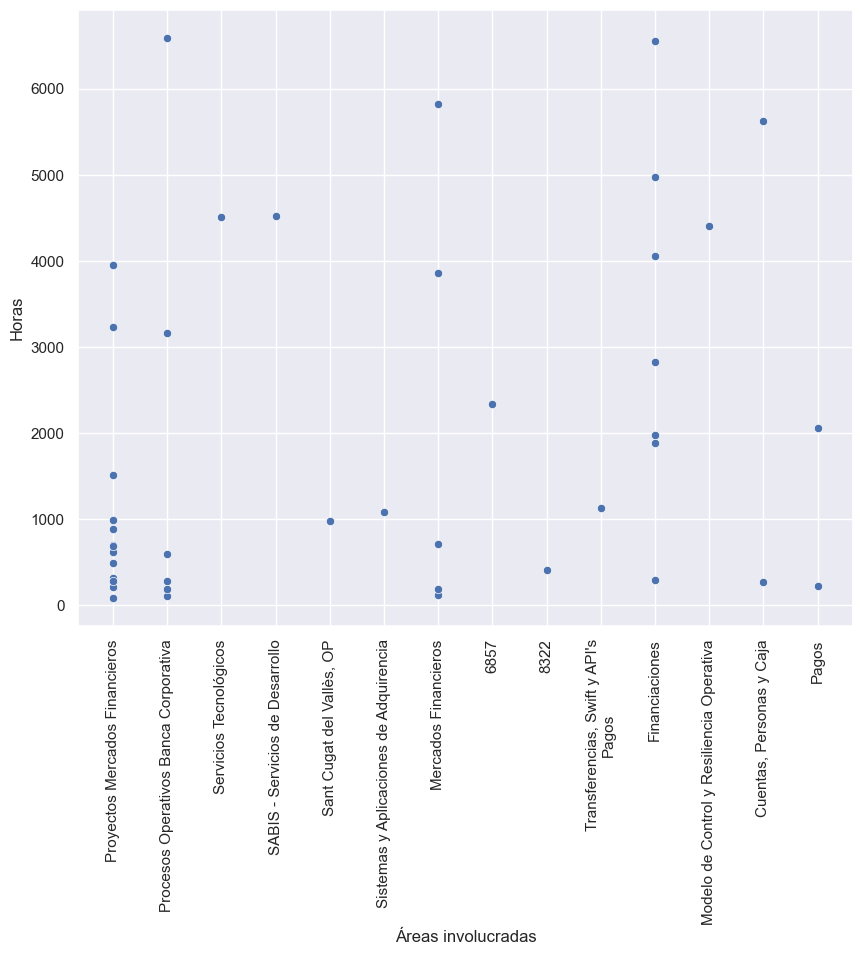

In [45]:
sns.scatterplot(x='Áreas involucradas', y='Horas', data=df)
plt.xticks(rotation=90)
plt.show()

## 10. Agrupacion IT Demanda

In [46]:
df = pd.read_csv("data_cleaned.csv",  index_col = 0, header=0)

In [47]:
df_no = df[df['Horas'] <= 30000]

In [48]:
df["Agrupación IT Demanda"].value_counts()

Agrupación IT Demanda
SISTEMAS CORPORATIVOS                         750
OPERACIONES Y TECNOLOGÍA PARTICULARES         255
OPERACIONES Y TECNOLOGÍA EMPRESAS Y RED       251
OPERACIONES Y TECNOLOGÍA BANCA CORPORATIVA    251
TECNOLOGÍA                                     55
5599                                           49
SABIS - SERVICIOS DE DESARROLLO                40
SABIS - SERVICIOS TECNOLÓGICOS                 30
INNOCELLS                                      14
DIGITAL, SERVICING Y VENTAS REMOTAS             9
9031                                            4
GESTIÓN DE COSTES                               2
PLANIFICACIÓN IT&OPS                            2
Name: count, dtype: int64

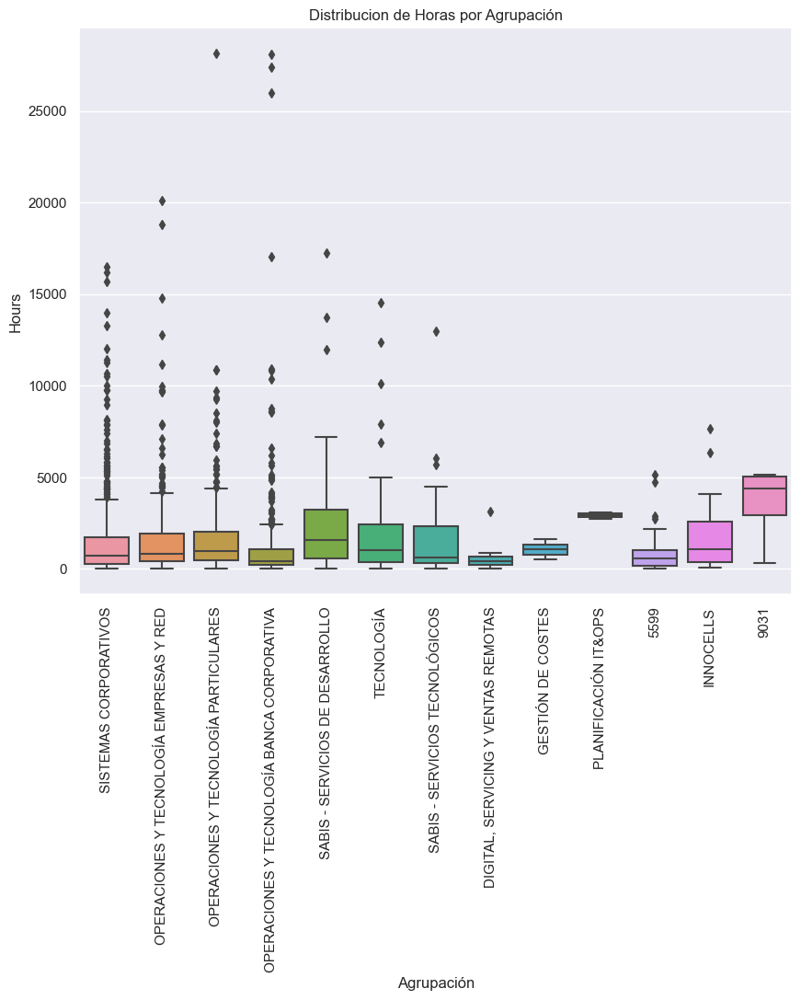

In [49]:
sns.boxplot(x='Agrupación IT Demanda', y='Horas', data = df_no)

# set the axis labels and title
plt.xlabel('Agrupación')
plt.ylabel('Hours')
plt.title('Distribucion de Horas por Agrupación')

# rotate the x-axis labels vertically
plt.xticks(rotation=90)

# show the plot
plt.show()

## 11. Gestor Demanda

In [51]:
top_15 = df["Gestor Demanda"].value_counts().head(15).index
df_gestor = df_no[df_no["Gestor Demanda"].isin(top_15.values)]

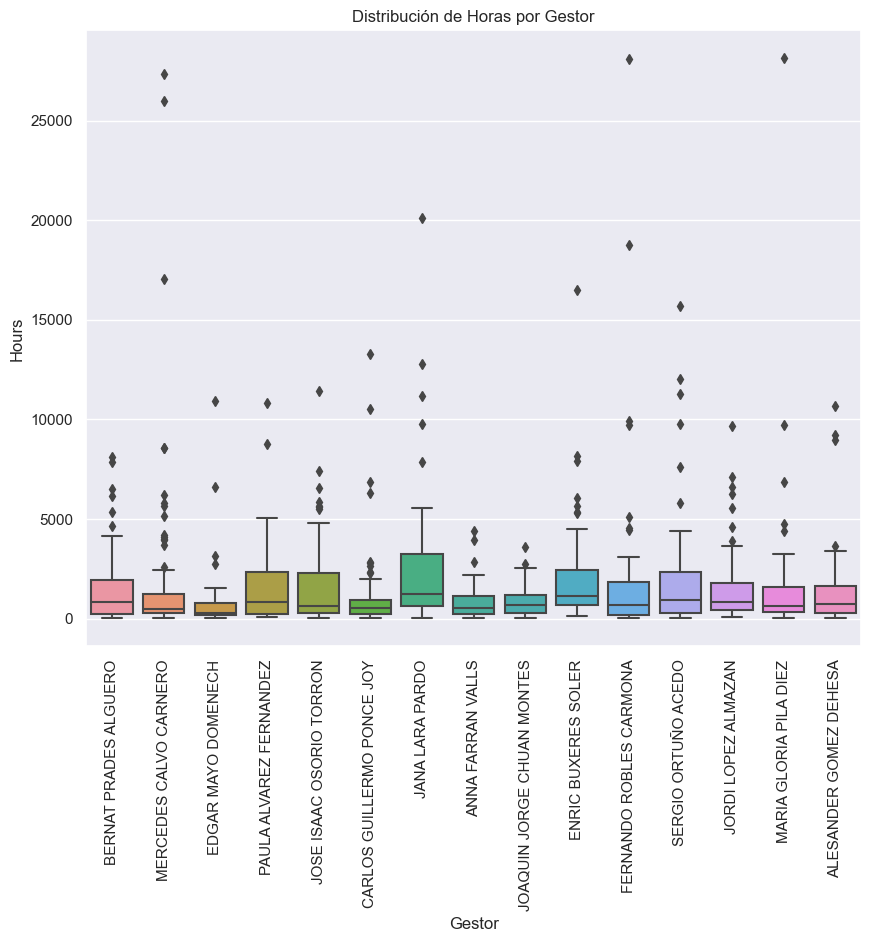

In [52]:
sns.boxplot(x='Gestor Demanda', y='Horas', data = df_gestor)

# set the axis labels and title
plt.xlabel('Gestor')
plt.ylabel('Hours')
plt.title('Distribución de Horas por Gestor')

# rotate the x-axis labels vertically
plt.xticks(rotation=90)

# show the plot
plt.show()

## 12. Categoria

In [53]:
df["Categoría"].value_counts()

Categoría
Proyecto                               1416
Mejoras aplicativas                     253
Mejoras técnicas                         19
Análisis de viabilidad                   13
Proyecto como Servicio                    7
Proyecto corporativo                      3
Proyecto subvencionado por terceros       1
Name: count, dtype: int64

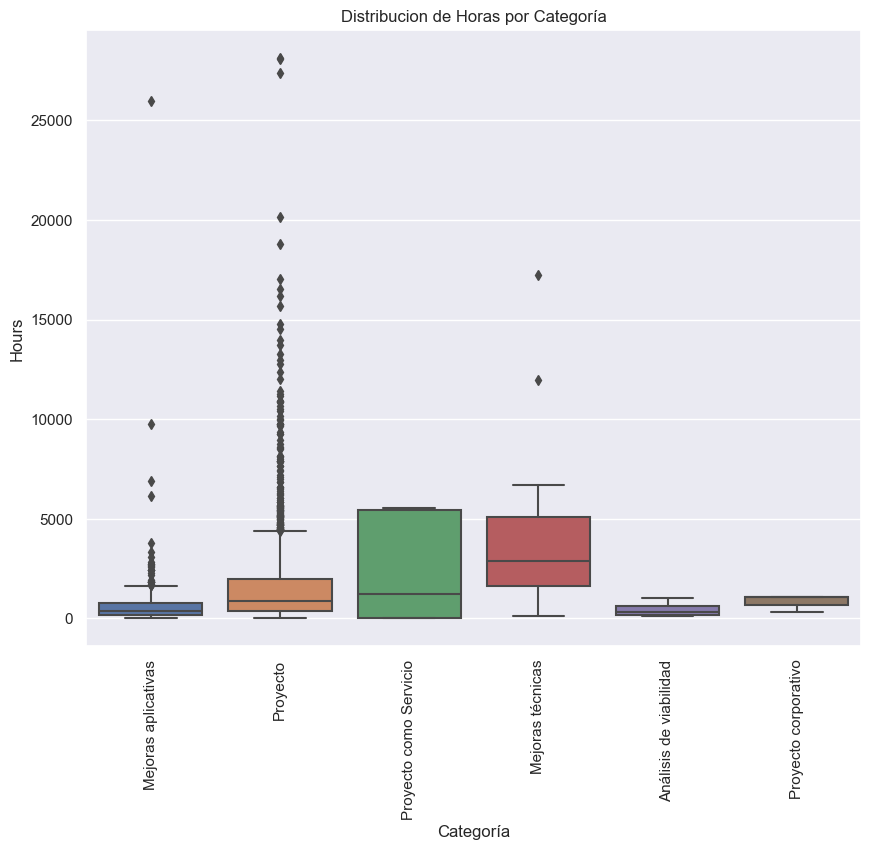

In [54]:
sns.boxplot(x='Categoría', y='Horas', data = df_no)

# set the axis labels and title
plt.xlabel('Categoría')
plt.ylabel('Hours')
plt.title('Distribucion de Horas por Categoría')

# rotate the x-axis labels vertically
plt.xticks(rotation=90)

# show the plot
plt.show()